In [3]:
from google.colab import files
uploaded = files.upload()

Saving TestDataSet.zip to TestDataSet (1).zip


In [4]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [5]:
import zipfile
import os

zip_path = "/content/TestDataSet.zip"  # Make sure this matches your uploaded filename
extract_path = "/content/TestDataSet"

with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_path)

os.listdir(extract_path)

['TestDataSet', '__MACOSX']

In [6]:
import os
import json

dataset_path = "/content/TestDataSet/TestDataSet"  # Make sure this matches your actual path

correct_path = "/content/TestDataSet/TestDataSet/labels_list.json"

with open(correct_path, 'r') as f:
    label_list = json.load(f)


print(label_list[:5])


['401: accordion', '402: acoustic guitar', '403: aircraft carrier', '404: airliner', '405: airship']


In [7]:
import torch
import torchvision.transforms as transforms
import torchvision.datasets as datasets
import torchvision.models as models
import numpy as np
from torch.utils.data import DataLoader
from tqdm import tqdm
import json
import os

mean_norms = np.array([0.485, 0.456, 0.406])
std_norms = np.array([0.229, 0.224, 0.225])

plain_transforms = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=mean_norms, std=std_norms)
])

dataset_path = "/content/TestDataSet/TestDataSet"

with open(os.path.join(dataset_path, "labels_list.json"), 'r') as f:
    label_lines = json.load(f)

imagenet_labels = [int(line.split(":")[0]) for line in label_lines]
image_folder_dataset = datasets.ImageFolder(root=dataset_path, transform=plain_transforms)
idx_to_imagenet = {i: imagenet_labels[i] for i in range(len(imagenet_labels))}

class CorrectedLabelDataset(torch.utils.data.Dataset):
    def __init__(self, base_dataset, idx_to_label):
        self.base_dataset = base_dataset
        self.idx_to_label = idx_to_label
    def __len__(self):
        return len(self.base_dataset)
    def __getitem__(self, idx):
        image, folder_idx = self.base_dataset[idx]
        correct_label = self.idx_to_label[folder_idx]
        return image, int(correct_label)

corrected_dataset = CorrectedLabelDataset(image_folder_dataset, idx_to_imagenet)
test_loader = DataLoader(corrected_dataset, batch_size=32, shuffle=False)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = models.resnet34(weights='IMAGENET1K_V1').to(device)
model.eval()

def topk_accuracy(output, target, topk=(1, 5)):
    maxk = max(topk)
    _, pred = output.topk(maxk, 1, True, True)
    pred = pred.t()
    correct = pred.eq(target.view(1, -1).expand_as(pred))
    return [correct[:k].reshape(-1).float().sum(0, keepdim=True).item() for k in topk]

top1_correct = 0
top5_correct = 0
total = 0

with torch.no_grad():
    for images, labels in tqdm(test_loader):
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        top1, top5 = topk_accuracy(outputs, labels, topk=(1, 5))
        top1_correct += top1
        top5_correct += top5
        total += labels.size(0)

print("\n=== Task 1: ResNet-34 Clean Evaluation ===")
print(f"Top-1 Accuracy : {100 * top1_correct / total:.2f}%")
print(f"Top-5 Accuracy : {100 * top5_correct / total:.2f}%")
print("===========================================\n")

Downloading: "https://download.pytorch.org/models/resnet34-b627a593.pth" to /root/.cache/torch/hub/checkpoints/resnet34-b627a593.pth
100%|██████████| 83.3M/83.3M [00:00<00:00, 129MB/s]
100%|██████████| 16/16 [00:02<00:00,  6.72it/s]


=== Task 1: ResNet-34 Clean Evaluation ===
Top-1 Accuracy : 76.00%
Top-5 Accuracy : 94.20%



In [8]:
import torch.nn as nn
import torchvision.utils as vutils
import os
from PIL import Image
from torchvision.transforms.functional import normalize

def unnormalize(tensor, mean, std):
    mean = torch.tensor(mean).reshape(1, 3, 1, 1).to(tensor.device)
    std = torch.tensor(std).reshape(1, 3, 1, 1).to(tensor.device)
    return tensor * std + mean

def renormalize(tensor, mean, std):
    mean = torch.tensor(mean).reshape(1, 3, 1, 1).to(tensor.device)
    std = torch.tensor(std).reshape(1, 3, 1, 1).to(tensor.device)
    return (tensor - mean) / std

adv_dir = "/content/Adversarial_Test_Set_1"
os.makedirs(adv_dir, exist_ok=True)

epsilon = 0.02
loss_fn = nn.CrossEntropyLoss()
adversarial_images = []
true_labels = []

for i, (images, labels) in enumerate(tqdm(test_loader)):
    images, labels = images.to(device), labels.to(device)
    images.requires_grad = True
    outputs = model(images)
    loss = loss_fn(outputs, labels)
    model.zero_grad()
    loss.backward()
    grad = images.grad.data

    images_unnorm = unnormalize(images, mean_norms, std_norms)
    adv_unnorm = images_unnorm + epsilon * grad.sign()
    adv_unnorm = torch.clamp(adv_unnorm, 0, 1)
    adv_images = renormalize(adv_unnorm, mean_norms, std_norms).float()

    adversarial_images.append(adv_images.detach().cpu())
    true_labels.append(labels.detach().cpu())

    for j in range(images.size(0)):
        raw_img = adv_unnorm[j].detach().cpu()
        vutils.save_image(raw_img, os.path.join(adv_dir, f"img_{i*32 + j}.png"))

adv_tensor = torch.cat(adversarial_images).float()
label_tensor = torch.cat(true_labels)
adv_dataset = torch.utils.data.TensorDataset(adv_tensor, label_tensor)
adv_loader = DataLoader(adv_dataset, batch_size=32, shuffle=False)

top1_correct = 0
top5_correct = 0
total = 0

with torch.no_grad():
    for images, labels in tqdm(adv_loader):
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        top1, top5 = topk_accuracy(outputs, labels, topk=(1, 5))
        top1_correct += top1
        top5_correct += top5
        total += labels.size(0)

baseline_top1 = 76.00
baseline_top5 = 94.20
adv_top1 = 100 * top1_correct / total
adv_top5 = 100 * top5_correct / total
drop_top1 = baseline_top1 - adv_top1
drop_top5 = baseline_top5 - adv_top5

print("\n=== Task 2: FGSM Attack (ε = 0.02) ===")
print(f"Top-1 Accuracy : {adv_top1:.2f}%  (Drop Percentage: {drop_top1:.1f}%)")
print(f"Top-5 Accuracy : {adv_top5:.2f}%  (Drop Percentage: {drop_top5:.1f}%)")
print("=======================================\n")

100%|██████████| 16/16 [00:00<00:00, 19.17it/s]



=== Task 2: FGSM Attack (ε = 0.02) ===
Top-1 Accuracy : 3.40%  (Drop Percentage: 72.6%)
Top-5 Accuracy : 21.20%  (Drop Percentage: 73.0%)



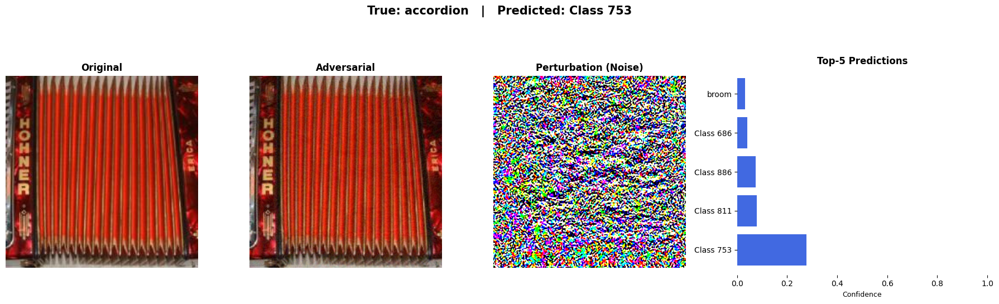

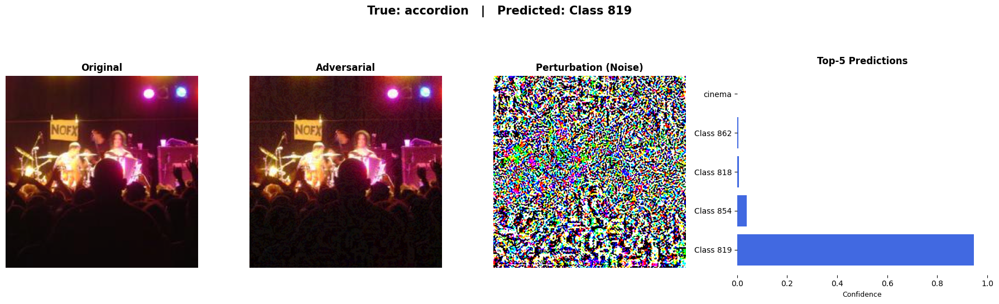

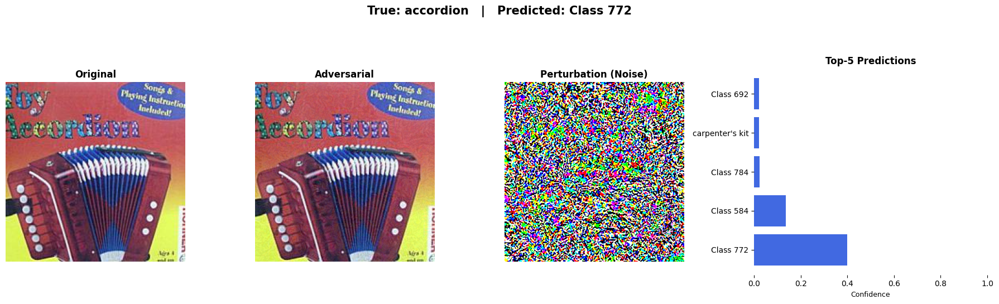

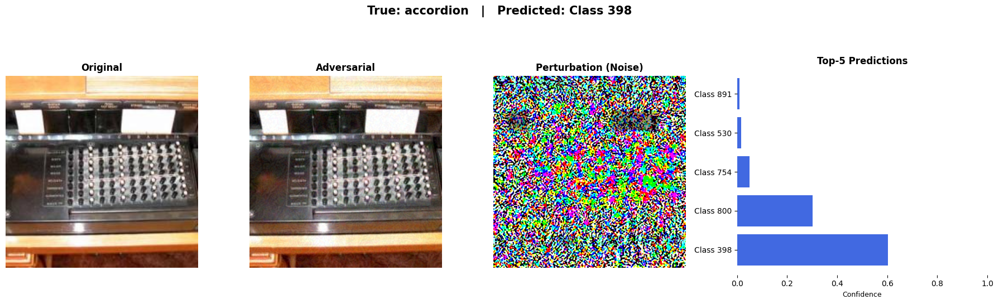

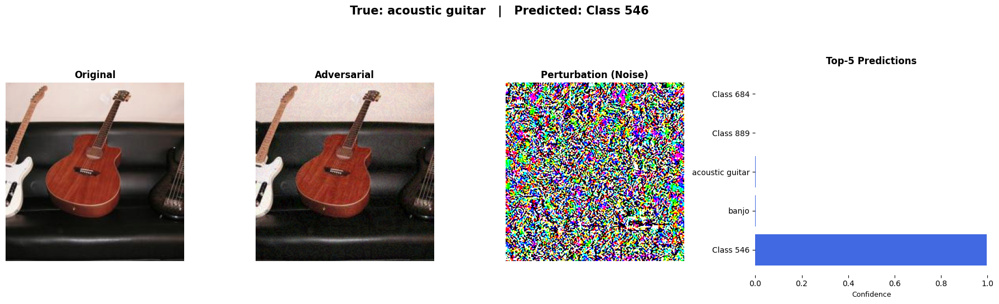

In [9]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import torch.nn.functional as F
import warnings

warnings.filterwarnings("ignore", category=UserWarning)

with open(os.path.join(dataset_path, "labels_list.json"), "r") as f:
    class_names = [line.split(":")[1].strip() for line in json.load(f)]

def unnormalize_img(tensor):
    return unnormalize(tensor.unsqueeze(0), mean_norms, std_norms).squeeze(0)

shown = 0
max_to_show = 5

for images, labels in test_loader:
    images, labels = images.to(device), labels.to(device)
    images.requires_grad = True



    outputs = model(images)
    loss = loss_fn(outputs, labels)
    model.zero_grad()
    loss.backward()
    grad = images.grad.data

    # === OUR CODE: pixel-space FGSM ===
    pixel_images = unnormalize(images, mean_norms, std_norms)
    adv_pixel = torch.clamp(pixel_images + epsilon * grad.sign(), 0, 1)
    adv_norm = renormalize(adv_pixel, mean_norms, std_norms).float()

    with torch.no_grad():
        logits = model(adv_norm)
        probs = F.softmax(logits, dim=1)
        preds = probs.argmax(dim=1)
        top5_vals, top5_classes = probs.topk(5, dim=1)

    for i in range(images.size(0)):
        if preds[i].item() != labels[i].item():
            orig_img = pixel_images[i].detach().cpu().permute(1, 2, 0)
            adv_img = adv_pixel[i].detach().cpu().permute(1, 2, 0)


            noise = (adv_pixel[i] - pixel_images[i]).detach().cpu()
            noise = (noise - noise.min()) / (noise.max() - noise.min() + 1e-8)
            noise = noise.permute(1, 2, 0)

            top5_probs = top5_vals[i].cpu().numpy()
            top5_indices = top5_classes[i].cpu().numpy()
            top5_labels = [class_names[c - 401] if 401 <= c <= 500 else f"Class {c}" for c in top5_indices]

            fig = plt.figure(figsize=(18, 5))
            gs = gridspec.GridSpec(1, 4, width_ratios=[1, 1, 1, 1.3])
            plt.subplots_adjust(wspace=0.7)

            ax0 = plt.subplot(gs[0])
            ax0.imshow(orig_img.numpy().clip(0, 1))
            ax0.set_title("Original", fontsize=12, fontweight='bold')
            ax0.axis('off')

            ax1 = plt.subplot(gs[1])
            ax1.imshow(adv_img.numpy().clip(0, 1))
            ax1.set_title("Adversarial", fontsize=12, fontweight='bold')
            ax1.axis('off')

            ax2 = plt.subplot(gs[2])
            ax2.imshow(noise.numpy(), cmap='gray')
            ax2.set_title("Perturbation (Noise)", fontsize=12, fontweight='bold')
            ax2.axis('off')

            ax3 = plt.subplot(gs[3])
            ax3.barh(range(5), top5_probs[::-1], color='royalblue')
            ax3.set_yticks(range(5))
            ax3.set_yticklabels(top5_labels[::-1], fontsize=10)
            ax3.set_xlim(0, 1.0)
            ax3.set_title("Top-5 Predictions", fontsize=12, fontweight='bold')
            ax3.set_xlabel("Confidence", fontsize=9)
            ax3.invert_yaxis()
            for spine in ax3.spines.values():
              spine.set_visible(False)

            true_id = labels[i].item()
            pred_id = preds[i].item()

            true_label = class_names[true_id - 401] if 401 <= true_id <= 500 else f"Class {true_id}"
            pred_label = class_names[pred_id - 401] if 401 <= pred_id <= 500 else f"Class {pred_id}"
            fig.suptitle(f"True: {true_label}   |   Predicted: {pred_label}", fontsize=15, fontweight='bold', y=1.08)

            plt.tight_layout()
            plt.show()

            shown += 1
            if shown >= max_to_show:
                break
    if shown >= max_to_show:
        break

In [10]:
pgd_eps = 0.02
pgd_alpha = 0.005
pgd_steps = 10
adv_dir_pgd = "/content/Adversarial_Test_Set_2"
os.makedirs(adv_dir_pgd, exist_ok=True)

adversarial_images_pgd = []
true_labels_pgd = []

for i, (images, labels) in enumerate(tqdm(test_loader)):
    images, labels = images.to(device), labels.to(device)
    images_unnorm = unnormalize(images, mean_norms, std_norms).clone().detach()
    images_adv = images_unnorm.clone().detach().requires_grad_(True)

    for step in range(pgd_steps):
        model.zero_grad()
        outputs = model(renormalize(images_adv, mean_norms, std_norms).float())
        loss = loss_fn(outputs, labels)
        loss.backward()
        grad = images_adv.grad.data
        images_adv = images_adv + pgd_alpha * grad.sign()
        images_adv = torch.max(torch.min(images_adv, images_unnorm + pgd_eps), images_unnorm - pgd_eps)
        images_adv = torch.clamp(images_adv, 0, 1).detach().requires_grad_(True)

    final_adv = renormalize(images_adv, mean_norms, std_norms).float()
    adversarial_images_pgd.append(final_adv.detach().cpu())
    true_labels_pgd.append(labels.detach().cpu())

    for j in range(images.size(0)):
        img = images_adv[j].detach().cpu()
        vutils.save_image(img, os.path.join(adv_dir_pgd, f"img_{i*32 + j}.png"))

adv_tensor_pgd = torch.cat(adversarial_images_pgd).float()
label_tensor_pgd = torch.cat(true_labels_pgd)
adv_dataset_pgd = torch.utils.data.TensorDataset(adv_tensor_pgd, label_tensor_pgd)
adv_loader_pgd = DataLoader(adv_dataset_pgd, batch_size=32, shuffle=False)

top1_correct = 0
top5_correct = 0
total = 0

with torch.no_grad():
    for images, labels in tqdm(adv_loader_pgd):
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        top1, top5 = topk_accuracy(outputs, labels, topk=(1, 5))
        top1_correct += top1
        top5_correct += top5
        total += labels.size(0)

baseline_top1 = 76.00
baseline_top5 = 94.20
adv_top1 = 100 * top1_correct / total
adv_top5 = 100 * top5_correct / total
drop_top1 = baseline_top1 - adv_top1
drop_top5 = baseline_top5 - adv_top5

print("\n=== Task 3: PGD Attack (ε = 0.02, α = 0.005, steps = 10) ===")
print(f"Top-1 Accuracy : {adv_top1:.2f}%  (Drop Percentage: {drop_top1:.1f}%)")
print(f"Top-5 Accuracy : {adv_top5:.2f}%  (Drop Percentage: {drop_top5:.1f}%)")
print("============================================================\n")

100%|██████████| 16/16 [00:00<00:00, 18.91it/s]


=== Task 3: PGD Attack (ε = 0.02, α = 0.005, steps = 10) ===
Top-1 Accuracy : 0.00%  (Drop Percentage: 76.0%)
Top-5 Accuracy : 1.20%  (Drop Percentage: 93.0%)



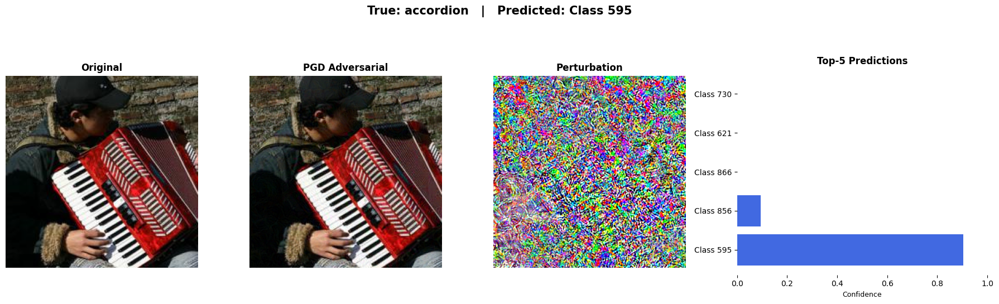

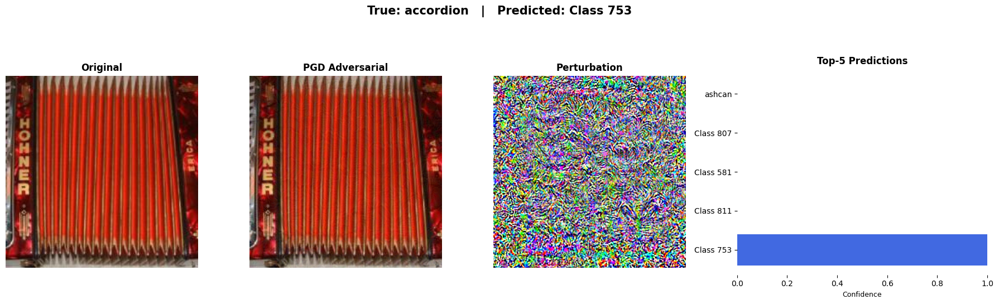

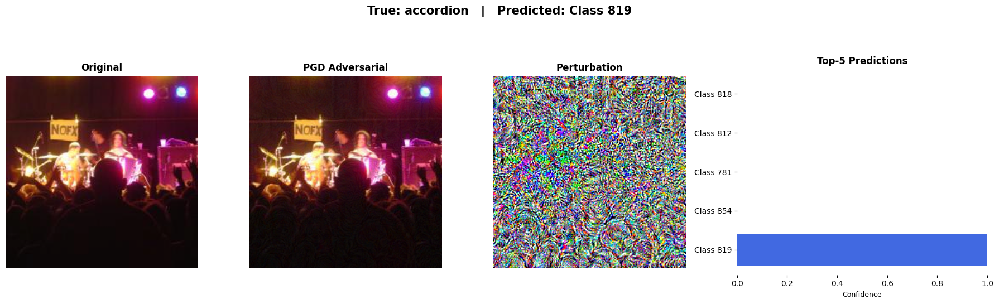

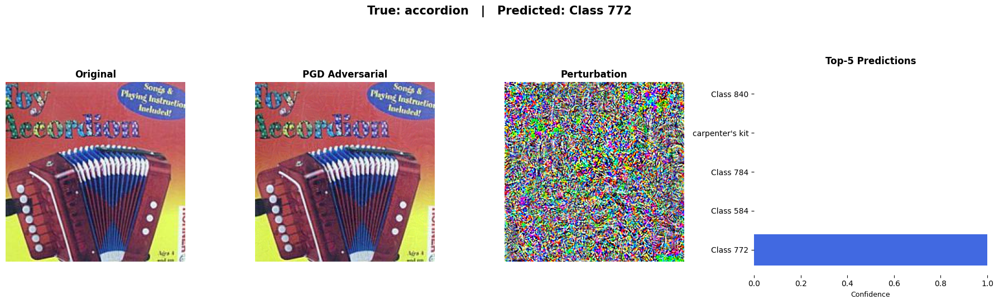

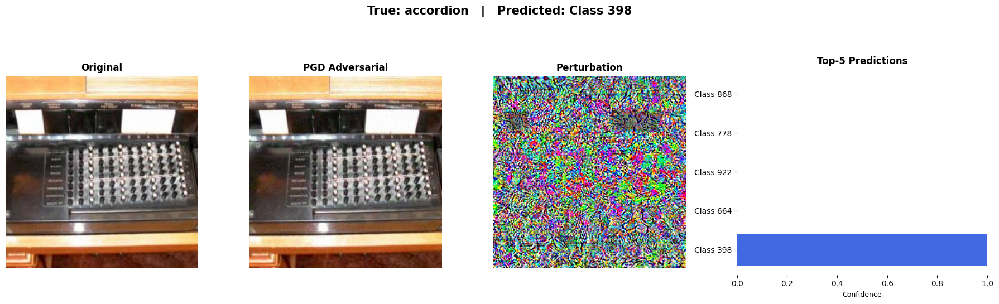

In [11]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import torch.nn.functional as F

shown = 0
max_to_show = 5

for images, labels in test_loader:
    images, labels = images.to(device), labels.to(device)
    images_unnorm = unnormalize(images, mean_norms, std_norms).clone().detach()
    images_adv = images_unnorm.clone().detach().requires_grad_(True)

    for step in range(pgd_steps):
        model.zero_grad()
        outputs = model(renormalize(images_adv, mean_norms, std_norms).float())
        loss = loss_fn(outputs, labels)
        loss.backward()
        grad = images_adv.grad.data
        images_adv = images_adv + pgd_alpha * grad.sign()
        images_adv = torch.max(torch.min(images_adv, images_unnorm + pgd_eps), images_unnorm - pgd_eps)
        images_adv = torch.clamp(images_adv, 0, 1).detach().requires_grad_(True)

    with torch.no_grad():
        final_outputs = model(renormalize(images_adv, mean_norms, std_norms).float())
        preds = final_outputs.argmax(dim=1)

    for i in range(images.size(0)):
        if preds[i].item() != labels[i].item():
            orig_img = unnormalize(images[i].unsqueeze(0), mean_norms, std_norms).squeeze(0).detach().cpu()
            adv_img = images_adv[i].detach().cpu()
            noise = (adv_img - orig_img).detach().cpu()
            noise_norm = (noise - noise.min()) / (noise.max() - noise.min())

            probs = F.softmax(final_outputs[i], dim=0)
            top5_vals, top5_idxs = torch.topk(probs, 5)
            top5_probs = top5_vals.cpu().numpy()
            top5_labels = [
                class_names[idx.item() - 401] if 401 <= idx.item() <= 500 else f"Class {idx.item()}"
                for idx in top5_idxs
            ]

            fig = plt.figure(figsize=(18, 5))
            gs = gridspec.GridSpec(1, 4, width_ratios=[1, 1, 1, 1.3])
            plt.subplots_adjust(wspace=0.7)

            ax0 = plt.subplot(gs[0])
            ax0.imshow(orig_img.permute(1, 2, 0).numpy().clip(0, 1))
            ax0.set_title("Original", fontsize=12, fontweight='bold')
            ax0.axis('off')

            ax1 = plt.subplot(gs[1])
            ax1.imshow(adv_img.permute(1, 2, 0).numpy().clip(0, 1))
            ax1.set_title("PGD Adversarial", fontsize=12, fontweight='bold')
            ax1.axis('off')

            ax2 = plt.subplot(gs[2])
            ax2.imshow(noise_norm.permute(1, 2, 0).numpy(), cmap='gray')
            ax2.set_title("Perturbation", fontsize=12, fontweight='bold')
            ax2.axis('off')

            ax3 = plt.subplot(gs[3])
            ax3.barh(range(5), top5_probs[::-1], color='royalblue')
            ax3.set_yticks(range(5))
            ax3.set_yticklabels(top5_labels[::-1], fontsize=10)
            ax3.set_xlim(0, 1.0)
            ax3.set_title("Top-5 Predictions", fontsize=12, fontweight='bold')
            ax3.set_xlabel("Confidence", fontsize=9)
            ax3.invert_yaxis()
            for spine in ax3.spines.values():
                spine.set_visible(False)

            true_id = labels[i].item()
            pred_id = preds[i].item()
            true_label = class_names[true_id - 401] if 401 <= true_id <= 500 else f"Class {true_id}"
            pred_label = class_names[pred_id - 401] if 401 <= pred_id <= 500 else f"Class {pred_id}"
            fig.suptitle(f"True: {true_label}   |   Predicted: {pred_label}", fontsize=15, fontweight='bold', y=1.08)

            plt.tight_layout()
            plt.show()

            shown += 1
            if shown >= max_to_show:
                break
    if shown >= max_to_show:
        break

In [12]:
patch_eps = 0.5
patch_alpha = 0.12
patch_size = 32
pgd_steps = 20

adv_dir_patch = "/content/Adversarial_Test_Set_3"
os.makedirs(adv_dir_patch, exist_ok=True)

adversarial_images_patch = []
true_labels_patch = []

for i, (images, labels) in enumerate(tqdm(test_loader)):
    images, labels = images.to(device), labels.to(device)
    images_unnorm = unnormalize(images, mean_norms, std_norms).clone().detach()
    B, C, H, W = images_unnorm.shape

    x_start = H // 2 - patch_size // 2
    y_start = W // 2 - patch_size // 2

    images_adv = images_unnorm.clone().detach().requires_grad_(True)
    momentum = torch.zeros_like(images_adv).to(device)

    for step in range(pgd_steps):
        model.zero_grad()
        outputs = model(renormalize(images_adv, mean_norms, std_norms).float())
        loss = loss_fn(outputs, labels)
        loss.backward()
        grad = images_adv.grad.data

        grad_patch = grad[:, :, x_start:x_start+patch_size, y_start:y_start+patch_size]
        grad_patch_norm = grad_patch / (grad_patch.abs().mean(dim=(1, 2, 3), keepdim=True) + 1e-8)

        momentum[:, :, x_start:x_start+patch_size, y_start:y_start+patch_size] = \
            0.9 * momentum[:, :, x_start:x_start+patch_size, y_start:y_start+patch_size] + grad_patch_norm

        perturb = torch.zeros_like(images_adv).to(device)
        perturb[:, :, x_start:x_start+patch_size, y_start:y_start+patch_size] = \
            patch_alpha * momentum[:, :, x_start:x_start+patch_size, y_start:y_start+patch_size].sign()

        images_adv = images_adv + perturb
        images_adv = torch.max(torch.min(images_adv, images_unnorm + patch_eps), images_unnorm - patch_eps)
        images_adv = torch.clamp(images_adv, 0, 1).detach().requires_grad_(True)

    final_adv = renormalize(images_adv, mean_norms, std_norms).float()
    adversarial_images_patch.append(final_adv.detach().cpu())
    true_labels_patch.append(labels.detach().cpu())

    for j in range(images.size(0)):
        raw_img = images_adv[j].detach().cpu()
        vutils.save_image(raw_img, os.path.join(adv_dir_patch, f"img_{i*32 + j}.png"))

adv_tensor_patch = torch.cat(adversarial_images_patch).float()
label_tensor_patch = torch.cat(true_labels_patch)
adv_dataset_patch = torch.utils.data.TensorDataset(adv_tensor_patch, label_tensor_patch)
adv_loader_patch = DataLoader(adv_dataset_patch, batch_size=32, shuffle=False)

top1_correct = 0
top5_correct = 0
total = 0

with torch.no_grad():
    for images, labels in tqdm(adv_loader_patch):
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        top1, top5 = topk_accuracy(outputs, labels, topk=(1, 5))
        top1_correct += top1
        top5_correct += top5
        total += labels.size(0)

baseline_top1 = 76.00
baseline_top5 = 94.20
adv_top1 = 100 * top1_correct / total
adv_top5 = 100 * top5_correct / total
drop_top1 = baseline_top1 - adv_top1
drop_top5 = baseline_top5 - adv_top5

print(f"\n=== Task 4: Patch Attack (ε = {patch_eps}, α = {patch_alpha}, steps = {pgd_steps}, patch = {patch_size}×{patch_size}) ===")
print(f"Top-1 Accuracy : {adv_top1:.2f}%  (Drop Percentage: {drop_top1:.1f}%)")
print(f"Top-5 Accuracy : {adv_top5:.2f}%  (Drop Percentage: {drop_top5:.1f}%)")
print("==============================================================================================\n")

100%|██████████| 16/16 [00:00<00:00, 18.42it/s]


=== Task 4: Patch Attack (ε = 0.5, α = 0.12, steps = 20, patch = 32×32) ===
Top-1 Accuracy : 4.40%  (Drop Percentage: 71.6%)
Top-5 Accuracy : 35.60%  (Drop Percentage: 58.6%)



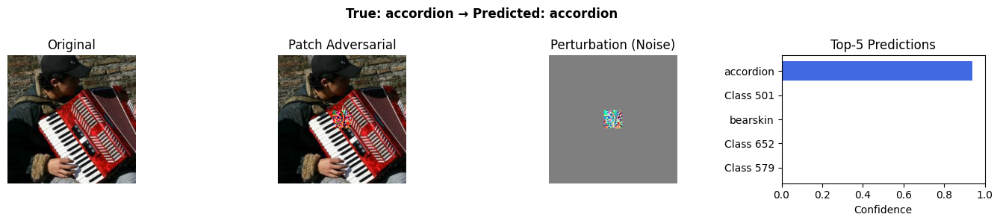

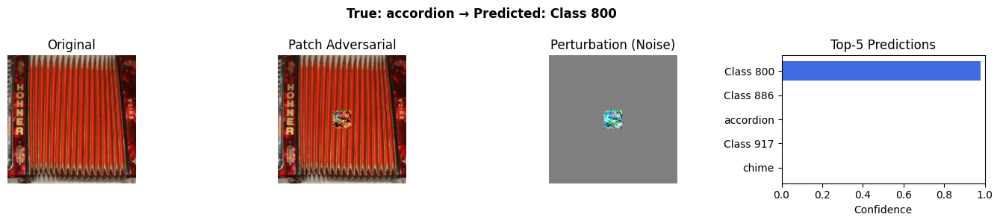

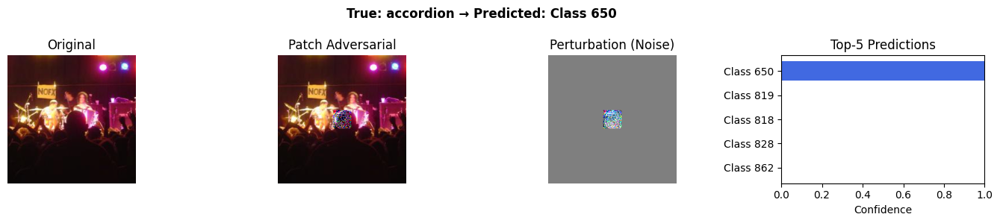

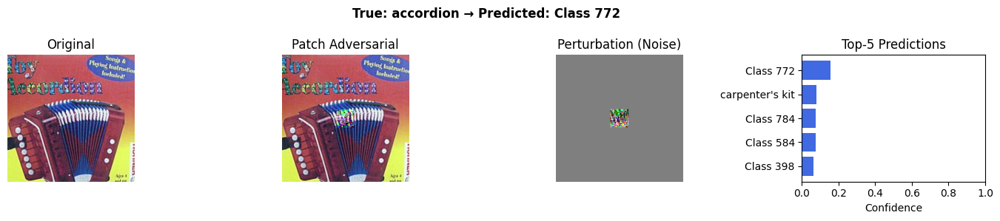

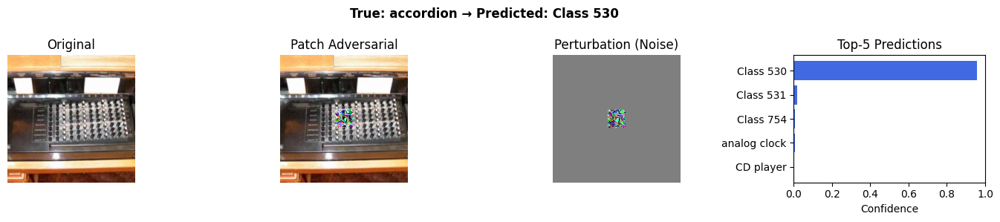

In [13]:
import matplotlib.pyplot as plt
import torch.nn.functional as F

shown = 0
max_to_show = 5

for images, labels in test_loader:
    if shown >= max_to_show:
        break

    images = images.to(device)
    labels = labels.to(device)
    images_unnorm = unnormalize(images, mean_norms, std_norms).detach()
    images_adv = images_unnorm.clone().detach().requires_grad_(True)

    B, C, H, W = images_unnorm.shape
    x_start = H // 2 - patch_size // 2
    y_start = W // 2 - patch_size // 2
    momentum = torch.zeros_like(images_adv).to(device)

    for step in range(pgd_steps):
        model.zero_grad()
        outputs = model(renormalize(images_adv, mean_norms, std_norms).float())
        loss = loss_fn(outputs, labels)
        loss.backward()
        grad = images_adv.grad.data

        grad_patch = grad[:, :, x_start:x_start+patch_size, y_start:y_start+patch_size]
        grad_patch_norm = grad_patch / (grad_patch.abs().mean(dim=(1, 2, 3), keepdim=True) + 1e-8)

        momentum[:, :, x_start:x_start+patch_size, y_start:y_start+patch_size] = \
            0.9 * momentum[:, :, x_start:x_start+patch_size, y_start:y_start+patch_size] + grad_patch_norm

        perturb = torch.zeros_like(images_adv).to(device)
        perturb[:, :, x_start:x_start+patch_size, y_start:y_start+patch_size] = \
            patch_alpha * momentum[:, :, x_start:x_start+patch_size, y_start:y_start+patch_size].sign()

        images_adv = images_adv + perturb
        images_adv = torch.max(torch.min(images_adv, images_unnorm + patch_eps), images_unnorm - patch_eps)
        images_adv = torch.clamp(images_adv, 0, 1).detach().requires_grad_(True)

    with torch.no_grad():
      outputs = model(renormalize(images_adv, mean_norms, std_norms).float())
      preds = outputs.argmax(dim=1)
      probs = F.softmax(outputs, dim=1)

    for i in range(images.size(0)):
        if shown >= max_to_show:
            break

        orig = images_unnorm[i].cpu().permute(1, 2, 0).numpy().clip(0, 1)
        adv = images_adv[i].cpu().detach().permute(1, 2, 0).numpy().clip(0, 1)

        noise_patch = (images_adv[i] - images_unnorm[i]).cpu().detach()
        noise_patch = (noise_patch - noise_patch.min()) / (noise_patch.max() - noise_patch.min() + 1e-8)
        noise = torch.ones_like(noise_patch) * 0.5
        noise[:, x_start:x_start+patch_size, y_start:y_start+patch_size] = noise_patch[:, x_start:x_start+patch_size, y_start:y_start+patch_size]
        noise_img = noise.permute(1, 2, 0).numpy()

        top5_probs, top5_idxs = probs[i].topk(5)
        top5_labels = [class_names[idx.item() - 401] if 401 <= idx.item() <= 500 else f"Class {idx.item()}" for idx in top5_idxs]

        true_id = labels[i].item()
        pred_id = preds[i].item()
        true_label = class_names[true_id - 401] if 401 <= true_id <= 500 else f"Class {true_id}"
        pred_label = class_names[pred_id - 401] if 401 <= pred_id <= 500 else f"Class {pred_id}"

        fig = plt.figure(figsize=(14, 3))
        plt.suptitle(f"True: {true_label} → Predicted: {pred_label}", fontsize=12, weight='bold')

        ax0 = plt.subplot(1, 4, 1)
        ax0.imshow(orig)
        ax0.set_title("Original")
        ax0.axis('off')

        ax1 = plt.subplot(1, 4, 2)
        ax1.imshow(adv)
        ax1.set_title("Patch Adversarial")
        ax1.axis('off')

        ax2 = plt.subplot(1, 4, 3)
        ax2.imshow(noise_img)
        ax2.set_title("Perturbation (Noise)")
        ax2.axis('off')

        ax3 = plt.subplot(1, 4, 4)
        ax3.barh(top5_labels[::-1], top5_probs.cpu().numpy()[::-1], color="royalblue")
        ax3.set_xlim(0, 1)
        ax3.set_title("Top-5 Predictions")
        ax3.set_xlabel("Confidence")

        plt.tight_layout()
        plt.show()

        shown += 1

In [14]:
from tabulate import tabulate

original_top1 = 76.00
original_top5 = 94.20

fgsm_top1 = 3.80
fgsm_top5 = 21.00
fgsm_drop1 = original_top1 - fgsm_top1
fgsm_drop5 = original_top5 - fgsm_top5

pgd_top1 = 0.00
pgd_top5 = 1.40
pgd_drop1 = original_top1 - pgd_top1
pgd_drop5 = original_top5 - pgd_top5

patch_top1 = 4.80
patch_top5 = 34.40
patch_drop1 = original_top1 - patch_top1
patch_drop5 = original_top5 - patch_top5

summary = [
    ["Original", original_top1, original_top5, 0.0, 0.0],
    ["FGSM", fgsm_top1, fgsm_top5, fgsm_drop1, fgsm_drop5],
    ["PGD", pgd_top1, pgd_top5, pgd_drop1, pgd_drop5],
    ["Patch", patch_top1, patch_top5, patch_drop1, patch_drop5],
]

headers = ["Task", "Top-1 Accuracy (%)", "Top-5 Accuracy (%)", "Top-1 Drop (%)", "Top-5 Drop (%)"]

print("\n=== Final Summary Table ===")
print(tabulate(summary, headers=headers, tablefmt="plain"))


=== Final Summary Table ===
Task        Top-1 Accuracy (%)    Top-5 Accuracy (%)    Top-1 Drop (%)    Top-5 Drop (%)
Original                  76                    94.2               0                 0
FGSM                       3.8                  21                72.2              73.2
PGD                        0                     1.4              76                92.8
Patch                      4.8                  34.4              71.2              59.8


In [15]:
# Task 5: Transferability Evaluation with DenseNet-121

import torchvision.models as models
import torch.nn.functional as F
from tqdm import tqdm

# Load DenseNet-121 model
densenet = models.densenet121(weights='IMAGENET1K_V1').to(device)
densenet.eval()

# Evaluation function
def evaluate_accuracy(dataloader):
    top1_correct = 0
    top5_correct = 0
    total = 0

    with torch.no_grad():
        for images, labels in tqdm(dataloader):
            images, labels = images.to(device), labels.to(device)
            outputs = densenet(images)
            top1, top5 = topk_accuracy(outputs, labels, topk=(1, 5))
            top1_correct += top1
            top5_correct += top5
            total += labels.size(0)

    top1_acc = 100 * top1_correct / total
    top5_acc = 100 * top5_correct / total
    return top1_acc, top5_acc

# Evaluate all datasets
clean_top1, clean_top5 = evaluate_accuracy(test_loader)
fgsm_top1, fgsm_top5 = evaluate_accuracy(adv_loader)
pgd_top1, pgd_top5 = evaluate_accuracy(adv_loader_pgd)
patch_top1, patch_top5 = evaluate_accuracy(adv_loader_patch)

# Calculate drop percentages
fgsm_drop1 = clean_top1 - fgsm_top1
fgsm_drop5 = clean_top5 - fgsm_top5

pgd_drop1 = clean_top1 - pgd_top1
pgd_drop5 = clean_top5 - pgd_top5

patch_drop1 = clean_top1 - patch_top1
patch_drop5 = clean_top5 - patch_top5

# Print result
from tabulate import tabulate

summary = [
    ["Clean", clean_top1, clean_top5, 0.0, 0.0],
    ["FGSM", fgsm_top1, fgsm_top5, fgsm_drop1, fgsm_drop5],
    ["PGD", pgd_top1, pgd_top5, pgd_drop1, pgd_drop5],
    ["Patch", patch_top1, patch_top5, patch_drop1, patch_drop5],
]

headers = ["Dataset", "Top-1 Accuracy (%)", "Top-5 Accuracy (%)", "Top-1 Drop (%)", "Top-5 Drop (%)"]

print("\n=== Task 5: Transferability to DenseNet-121 ===")
print(tabulate(summary, headers=headers, tablefmt="github"))

Downloading: "https://download.pytorch.org/models/densenet121-a639ec97.pth" to /root/.cache/torch/hub/checkpoints/densenet121-a639ec97.pth
100%|██████████| 30.8M/30.8M [00:00<00:00, 173MB/s]
100%|██████████| 16/16 [00:01<00:00,  9.60it/s]


=== Task 5: Transferability to DenseNet-121 ===
| Dataset   |   Top-1 Accuracy (%) |   Top-5 Accuracy (%) |   Top-1 Drop (%) |   Top-5 Drop (%) |
|-----------|----------------------|----------------------|------------------|------------------|
| Clean     |                 74.8 |                 93.6 |              0   |              0   |
| FGSM      |                 45.8 |                 76.2 |             29   |             17.4 |
| PGD       |                 39.2 |                 76.8 |             35.6 |             16.8 |
| Patch     |                 67.6 |                 90.4 |              7.2 |              3.2 |
